<a href="https://colab.research.google.com/github/sreyadhar/Machine-Learning-TensorFlow/blob/main/Fraym_io_Part1_Dhar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fraym.io assessment Part-1
# Created by Sreya Dhar
## Dated: 10/19/21

In [1]:
### Fraym.io assessment Part-1 ####
###################################

## Import necessary libraries
import random
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
%matplotlib inline

### Upload Data

In [2]:
# %% Uploading the dataset
data_path = "nga_median_spend_model_train_data.xlsx"
data = pd.read_excel(data_path)
data = data.iloc[:,1:]
data.head()


,median_spend,lat,long,accessibility_to_cities_2015,chirps_2015,chirps_average_2002_2015,distance_to_ports_2012,distance_to_powerplants_2016,distance_to_roads_2015,distance_to_transmission_lines_2016,landscan_population_2017,modis_evi_2000_2016,modis_lst_day_average_2015,modis_lst_night_average_2015,modis_ndvi_2000_2016,sedac_gpw_2015,srtm_2000,viirs_nightlights_2015
0,68483.33333,6.234257,6.497140,1.228036,4.112926,1918.483032,6.111320,0.528430,1287.481201,0.025043,1.144105,4642.536621,27.858854,20.202896,5933.850586,211.798035,251.207886,1.760000e-11
1,576432.00000,5.465409,7.569494,0.900000,5.369960,2322.145264,3.400000,0.425436,280.803894,0.042735,1027.555542,4314.119141,28.686144,20.599003,5630.924805,663.465454,119.743340,2.616757e-01
2,179028.88890,5.633261,5.890409,3.200000,5.355127,2561.145508,14.500000,0.081578,368.579987,0.032427,2410.116943,3751.576172,28.655008,20.485933,5060.738770,381.654266,14.505296,1.052445e+00
3,204486.66670,6.116370,6.906873,0.200000,4.547003,1953.459595,6.100000,0.522609,198.382629,0.031680,2771.898193,3663.174561,28.987793,20.612370,5077.917969,6125.996094,212.727005,3.812403e-01
4,84011.25000,5.289804,7.578037,1.876713,5.507172,2380.702148,4.064011,0.310401,306.397583,0.034884,429.929962,4065.373291,27.559258,20.117275,5374.149902,829.245666,75.765724,0.000000e+00


In [3]:
data.shape

(541, 18)

In [4]:
# Printing the types of data in the dataset 
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   median_spend                         541 non-null    float64
 1   lat                                  541 non-null    float64
 2   long                                 541 non-null    float64
 3   accessibility_to_cities_2015         541 non-null    float64
 4   chirps_2015                          541 non-null    float64
 5   chirps_average_2002_2015             541 non-null    float64
 6   distance_to_ports_2012               541 non-null    float64
 7   distance_to_powerplants_2016         541 non-null    float64
 8   distance_to_roads_2015               541 non-null    float64
 9   distance_to_transmission_lines_2016  541 non-null    float64
 10  landscan_population_2017             541 non-null    float64
 11  modis_evi_2000_2016             

In [5]:
## any missing value
data.isna().sum()

median_spend                           0
lat                                    0
long                                   0
accessibility_to_cities_2015           0
chirps_2015                            0
chirps_average_2002_2015               0
distance_to_ports_2012                 0
distance_to_powerplants_2016           0
distance_to_roads_2015                 0
distance_to_transmission_lines_2016    0
landscan_population_2017               0
modis_evi_2000_2016                    0
modis_lst_day_average_2015             0
modis_lst_night_average_2015           0
modis_ndvi_2000_2016                   0
sedac_gpw_2015                         0
srtm_2000                              0
viirs_nightlights_2015                 0
dtype: int64

In [6]:
## data descriptions for numerical variables
np.round(data.describe(),2)

,median_spend,lat,long,accessibility_to_cities_2015,chirps_2015,chirps_average_2002_2015,distance_to_ports_2012,distance_to_powerplants_2016,distance_to_roads_2015,distance_to_transmission_lines_2016,landscan_population_2017,modis_evi_2000_2016,modis_lst_day_average_2015,modis_lst_night_average_2015,modis_ndvi_2000_2016,sedac_gpw_2015,srtm_2000,viirs_nightlights_2015
count,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00,541.00
mean,119664.58,8.11,7.06,1.88,3.69,1531.36,12.95,1.60,758.51,0.10,3017.84,3098.29,33.24,19.78,4264.89,1618.79,257.89,1.98
std,117803.74,2.41,2.41,1.91,1.38,646.16,8.17,1.53,1298.28,0.18,6016.00,896.95,4.38,1.57,1199.95,4015.63,224.37,4.88
min,13936.00,4.40,2.88,0.10,1.09,363.81,0.69,0.06,0.00,0.00,0.00,648.57,24.57,13.81,709.83,13.40,1.34,0.00
25%,54172.50,6.32,5.05,0.60,2.74,1091.32,6.15,0.43,170.33,0.01,82.93,2326.64,29.27,18.94,3225.00,155.60,67.69,0.00
50%,90300.00,7.52,7.08,1.48,3.46,1412.58,11.10,1.04,365.83,0.03,608.26,3179.06,32.75,20.06,4424.73,357.24,219.92,0.01
75%,140685.00,9.75,8.47,2.54,4.60,1991.28,19.60,2.32,874.63,0.12,3470.89,3875.39,36.92,20.68,5235.94,1074.79,391.36,1.28
max,1092064.00,13.71,13.63,19.60,7.85,3959.34,37.50,7.30,19443.60,1.25,58450.32,4884.86,43.55,22.99,6748.33,35373.10,1304.37,65.61


* No missing values and all the variables are numerical variables.




## Exploratory Data Analysis

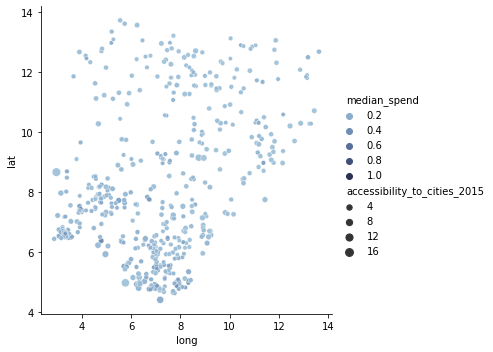

In [7]:

sns.relplot(x="long", y="lat", hue="median_spend", size="accessibility_to_cities_2015", data=data, palette="ch:r=-.15,l=.75")


* The places which are relatively closer to cities have higher median expenditure. 

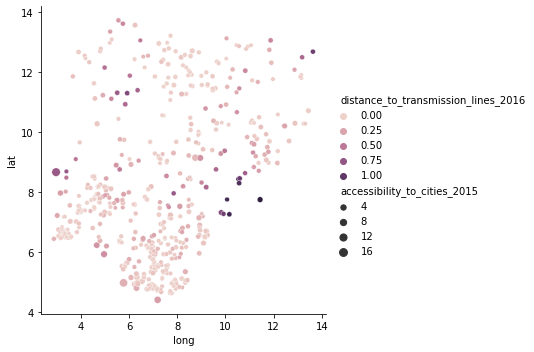

In [8]:
sns.relplot(x="long", y="lat", hue="distance_to_transmission_lines_2016", size="accessibility_to_cities_2015", data=data)

* There are few places where distance to transmission lines larger as these places are remote to urban areas. 

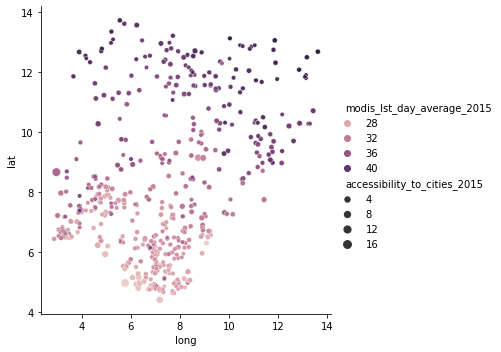

In [9]:

sns.relplot(x="long", y="lat", hue="modis_lst_day_average_2015", size="accessibility_to_cities_2015", data=data)

* Northern part of the region is warmer than the southern zones.  

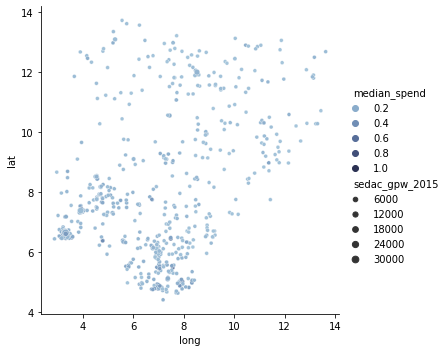

In [10]:

sns.relplot(x="long", y="lat", hue="median_spend", size="sedac_gpw_2015", sizes=(15, 50), data=data,palette="ch:r=-.15,l=.75")

* Median expenditure is higher where population density is comparatively lower.

In [11]:
# %% #Import Library folium
import folium
import xlrd
from folium.plugins import MarkerCluster

latitude = data['lat']
longitude = data['long']
median_spend = data['median_spend']

#Create base map
map = folium.Map(location=[8, 10 ], zoom_start = 6, control_scale=True)

marker_cluster = MarkerCluster().add_to(map)

In [12]:
## loop through the rows in dataset for Nigerian places, and create a circle based on Expenditure
for index, row in data.iterrows():
    # set up the variables
    lat = row['lat']
    lon = row['long']
    label = str(row['median_spend']) 
    size = row['median_spend']**0.5

    
    # create a circle for every row
    circle = folium.Circle(
        radius=size,
        location=[lat,lon],
        tooltip = label,
        color='crimson',
        fill = True
    )
    circle.add_to(map)

# show the map
map

In [13]:
! pip install chart_studio

     |████████████████████████████████| 64 kB 1.5 MB/s 


In [14]:
# importing plotly library
# import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
# from IPython.display import HTML
import plotly.express as px
# import figure factory
import plotly.figure_factory as ff

## incell plotly graph visualization
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

* Median Expenditure plot in plotly with locations and 
'accessibility_to_cities_2015' [chart-studio.plotly.com]

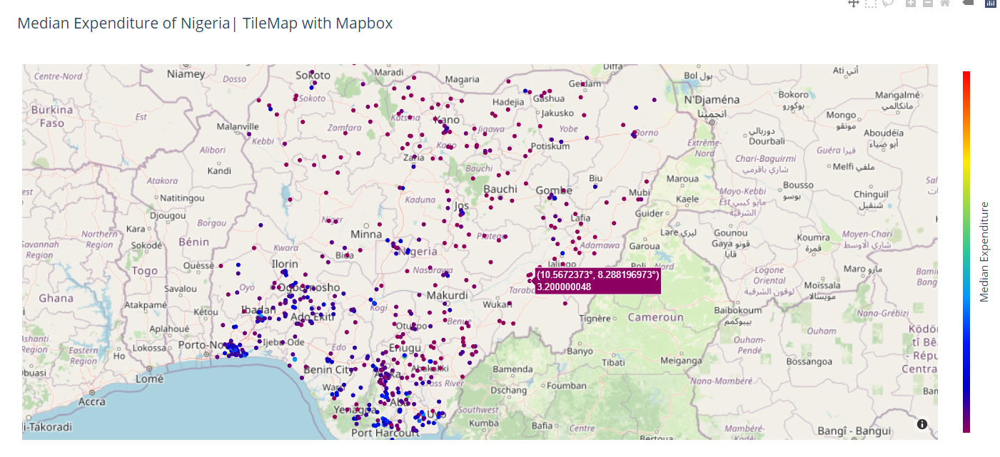

Zoomed View:

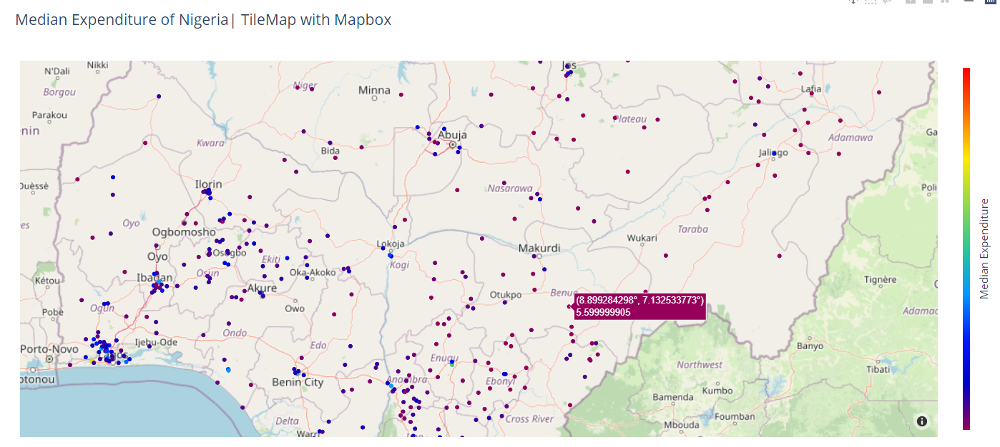

In [15]:
enable_plotly_in_cell() ## calling for incell plotly graph visualization
## box-cum-scatter matrix for different numerical features
# preparing data
data_1 = data.loc[:,["median_spend","accessibility_to_cities_2015", "landscan_population_2017", 'modis_ndvi_2000_2016']]

# add index feauture in data_1
data_1 ['index'] = np.arange(1,len(data_1)+1)

# figure: in parentheses we have (our data, plot we want to see in the diagonal, index, color map,..)
fig = ff.create_scatterplotmatrix (data_1, diag='box', index='index', colormap='Portland',
                                  colormap_type='seq', height=900, width=900)

iplot(fig)
## To save the plot
# plt.savefig('scatterplotmatrix.png')
plt.show()

* Median_spend is not following any general trend with other predictors

In [16]:

enable_plotly_in_cell() ## calling for incell plotly graph visualization
## box-cum-violin plot of different amenity distances in plotly
#visualization
trace0 = go.Violin(
    y=data.distance_to_transmission_lines_2016,
    box_visible = True,
    name = 'distance_to_transmission_lines_2016',
    marker = dict(
        color = 'rgb(12, 12, 140)'
    )
)
trace1 = go.Violin(
    y=data.distance_to_ports_2012,
    box_visible = True,
    name = 'distance_to_ports',
    marker = dict(
        color = 'rgb(12, 128, 128)'
    )
)
trace2 = go.Violin(
    y=data.distance_to_powerplants_2016,
    box_visible = True,
    name = 'distance_to_powerplants_2016',
    marker = dict(
        color = 'rgb(255, 128, 2)'
    )
)

data2 = [trace0, trace1, trace2]

layout = dict(title = 'Comparison among amenity distances to locations',
              yaxis= dict(title= 'Distances (m)',ticklen= 5,zeroline= False),
              template='plotly_white'
             )

fig = dict(data = data2, layout = layout)
iplot(fig)

(array([361., 129.,  30.,  10.,   3.,   2.,   2.,   1.,   1.,   2.]),
 array([  13936. ,  121748.8,  229561.6,  337374.4,  445187.2,  553000. ,
         660812.8,  768625.6,  876438.4,  984251.2, 1092064. ]),
 <a list of 10 Patch objects>)

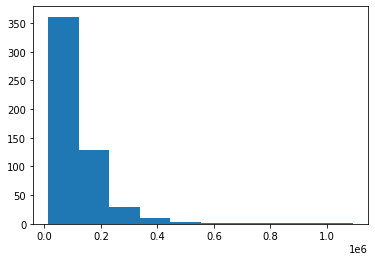

In [17]:
## Distribution of response variable
plt.hist(data['median_spend'])


### Dealing with Outliers

In [18]:
# Drop whose values(rows) those are outliers (>99.7% or <0.3 percentile)
for col in data.columns:
    data_2 = data.loc[data[col] <= data[col].quantile(0.97)]
    data_2 = data.loc[data[col] >= data[col].quantile(0.03)]

print(f"Updated Shape after dropping very high values, Outlier : {data_2.shape}")

if data.shape==data_2.shape:
  print("There is no outlier in the preprocessed dataset")
else:
  print('Outliers have been removed')

Updated Shape after dropping very high values, Outlier : (541, 18)
There is no outlier in the preprocessed dataset


* Quantile rules have not thrown out any datapoint as outlier from the given dataset



### Feature Engineering

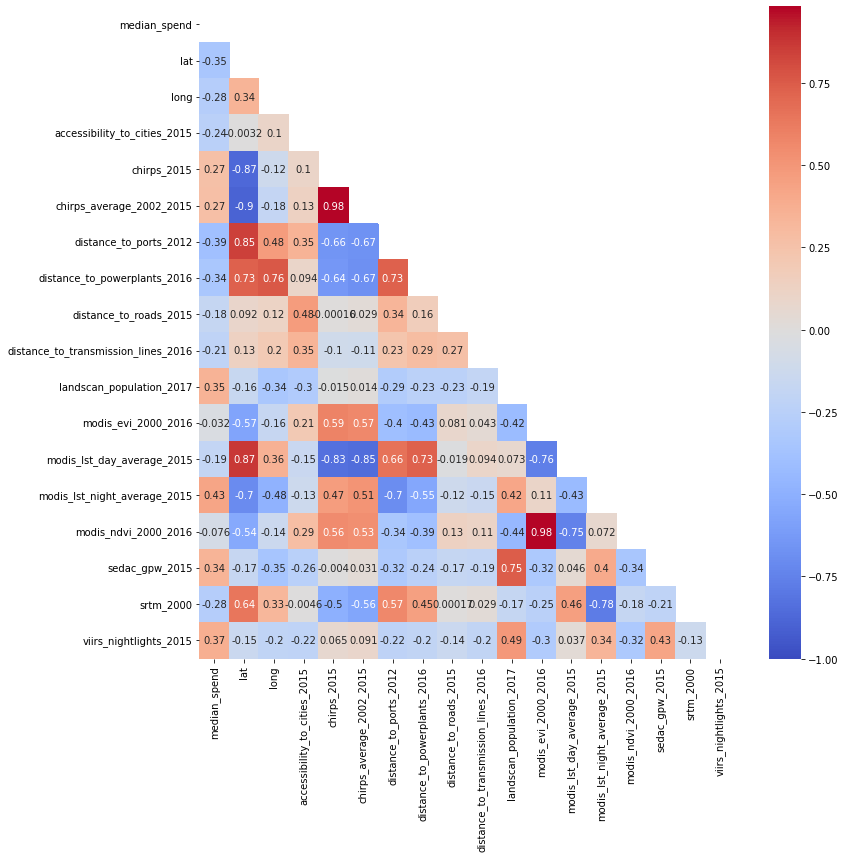

In [19]:
## Visualizing the correlation matrix and Heatmap
plt.figure(figsize=(12,12))
cols = data.columns
mask = np.zeros_like(data[cols].corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(data[cols].corr(), 
            vmin = -1,
            cmap='coolwarm',
            annot=True,
            mask=mask)
# plt.savefig('corr-matrix.png')
plt.show()

### Lasso Regression

In [20]:
# %% ### Model Lasso regression
from sklearn.linear_model import Ridge, RidgeCV, ElasticNet, LassoCV, LassoLarsCV
def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, data.iloc[:,1:], data.iloc[:,0],
                                   scoring="neg_mean_squared_error", cv = 15))
    return(rmse)

model_lasso = LassoCV(alphas = [0.0005, 0.001, 0.1, 1]).fit( data.iloc[:,1:], data.iloc[:,0])
print(rmse_cv(model_lasso).mean())

92039.79220484161


In [21]:
# %% ### Model Lasso regression (l1):: Select features
coef = pd.Series(model_lasso.coef_, index = data.columns[1:])
print(f"\n {coef.head}")

## Feature imp[ortance from Lasso Regression 
if sum(coef != 0)==data.iloc[:, 1:].shape[1]:
  print("\nLasso picked " + str(sum(coef != 0)) + " variables and eliminated " 
        +  str(sum(coef == 0.0)) + " variable")


 <bound method NDFrame.head of lat                                   -16225.933867
long                                  -11482.235123
accessibility_to_cities_2015           -8812.901951
chirps_2015                            50315.943174
chirps_average_2002_2015                 -71.659801
distance_to_ports_2012                  2560.820810
distance_to_powerplants_2016           10262.688979
distance_to_roads_2015                    -2.477535
distance_to_transmission_lines_2016   -17652.717970
landscan_population_2017                  -0.337424
modis_evi_2000_2016                       29.963512
modis_lst_day_average_2015              1034.771000
modis_lst_night_average_2015           11946.832730
modis_ndvi_2000_2016                     -35.049917
sedac_gpw_2015                             2.843129
srtm_2000                                 33.636635
viirs_nightlights_2015                  4179.032761
dtype: float64>

Lasso picked 17 variables and eliminated 0 variable


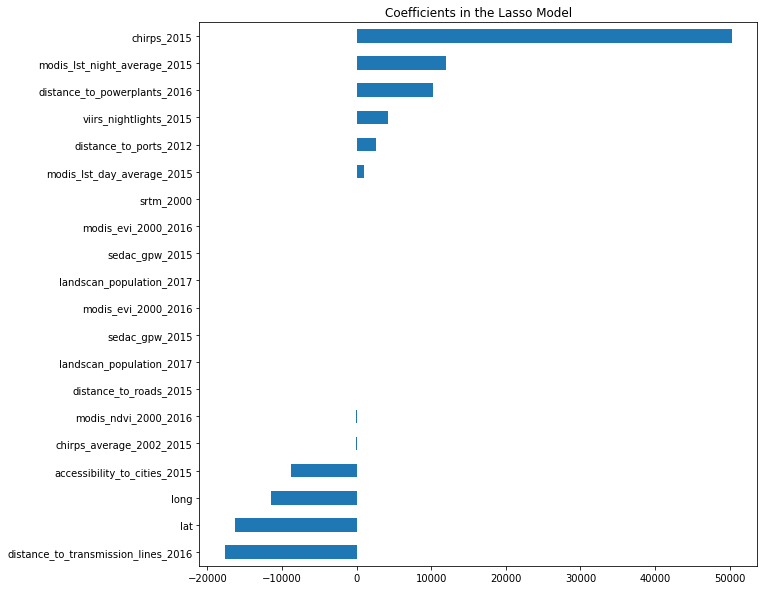

In [22]:
# %% plot feature coeff from Lasso regression 

imp_coef = pd.concat([coef.sort_values().head(10),
                     coef.sort_values().tail(10)])
plt.rcParams['figure.figsize'] = (10.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")
plt.show()

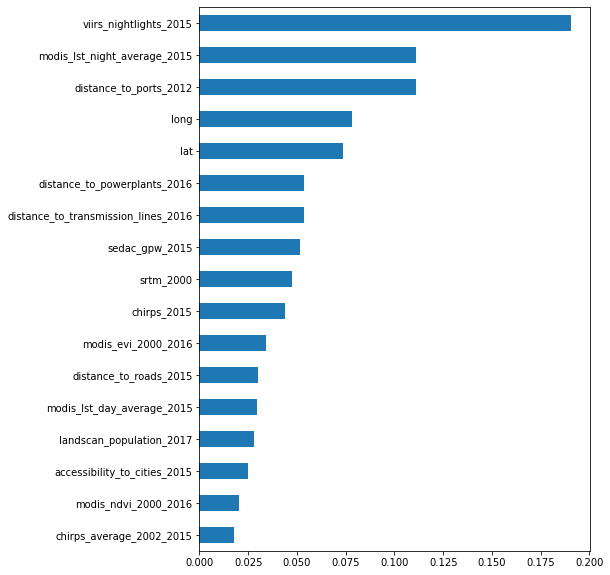

In [23]:
## Feature selection from RandomForestRegressor (double-check)
# %%% ### # Basic imports
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
# Set seed for reproducibility
SEED = 1234
test_scores, train_scores = [], []
for i in [1,3,5,7,10,20,25,30,60,80]:
      rfc = RandomForestRegressor(n_estimators=i, random_state=1111)
      rfc=rfc.fit(data.iloc[:, 1:], data.iloc[:, 0]) # print(rfc)
# Create a pd.Series of features importances
importances_rf = pd.Series(rfc.feature_importances_, index = data.columns[1:])
# Sort importances_rf
sorted_importances_rf = importances_rf.sort_values()
# print(sorted_importances_rf)
# Make a horizontal bar plot
plt.figure(figsize=(7,10))
sorted_importances_rf.plot(kind='barh'); 

In [24]:
# %% Cumilative feature improtance from RFR
print(sorted_importances_rf.shape)
sorted_importances_rf_1 = importances_rf.sort_values(ascending=False)
df_1=sorted_importances_rf_1.to_frame()

# # List of features sorted from most to least important
df_1 = df_1.rename_axis('Index')
print(df_1)
df_1['id'] = list(df_1.index)
sorted_features = df_1['id']

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances_rf_1)

(17,)
                                            0
Index                                        
viirs_nightlights_2015               0.190772
modis_lst_night_average_2015         0.111070
distance_to_ports_2012               0.111024
long                                 0.078460
lat                                  0.073686
distance_to_powerplants_2016         0.053684
distance_to_transmission_lines_2016  0.053361
sedac_gpw_2015                       0.051579
srtm_2000                            0.047534
chirps_2015                          0.044108
modis_evi_2000_2016                  0.034337
distance_to_roads_2015               0.029816
modis_lst_day_average_2015           0.029548
landscan_population_2017             0.027954
accessibility_to_cities_2015         0.025080
modis_ndvi_2000_2016                 0.020415
chirps_average_2002_2015             0.017571


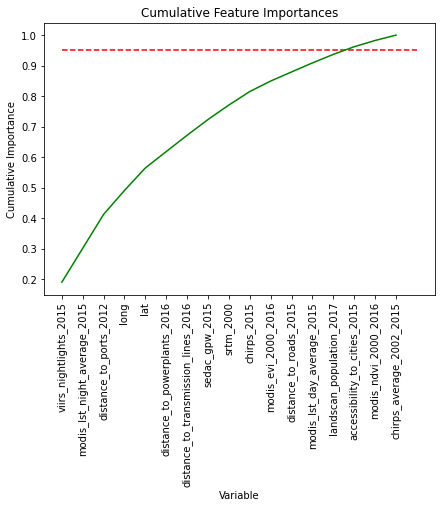

In [25]:
# %% Cumilative feature improtance plot from RFR
# list of x locations for plotting
x_values = list(range(len(sorted_importances_rf_1)))
plt.figure(figsize=(7,5))
plt.plot(x_values, cumulative_importances, 'g-')


# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances_rf_1), 
            color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')
# Axis labels and title
plt.xlabel('Variable'); 
plt.ylabel('Cumulative Importance'); 
plt.title('Cumulative Feature Importances');

* Selection of Features:


1.   None of the features have been identified as unimportant in Lasso Regression 
2.   Random forest regressor importance coefficients have taken 14 features to reach 95% feature importance

**Hence, none of the feature has been considered as negligible or thrown out from further study**.



### Data Normalization

In [26]:
# %% # Normalization of the feature variables
X_1 = data.drop(['median_spend'], axis = 1)
y = data['median_spend']

In [27]:
## Min-max scaling has been applied on the predictor variables
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_1=pd.DataFrame(scaler.fit_transform(X_1), columns=X_1.columns)
X_1.head()



,lat,long,accessibility_to_cities_2015,chirps_2015,chirps_average_2002_2015,distance_to_ports_2012,distance_to_powerplants_2016,distance_to_roads_2015,distance_to_transmission_lines_2016,landscan_population_2017,modis_evi_2000_2016,modis_lst_day_average_2015,modis_lst_night_average_2015,modis_ndvi_2000_2016,sedac_gpw_2015,srtm_2000,viirs_nightlights_2015
0,0.197066,0.336488,0.057838,0.447233,0.432390,0.147389,0.064260,0.066216,0.020109,0.000020,0.942799,0.173347,0.696830,0.865118,0.005611,0.191757,2.682637e-13
1,0.114534,0.436230,0.041019,0.633038,0.544658,0.073741,0.050021,0.014442,0.034316,0.017580,0.865274,0.216929,0.739973,0.814953,0.018384,0.090865,3.988527e-03
2,0.132552,0.280054,0.158947,0.630845,0.611130,0.375251,0.002483,0.018956,0.026039,0.041234,0.732482,0.215289,0.727658,0.720528,0.010414,0.010101,1.604164e-02
3,0.184411,0.374598,0.005127,0.511395,0.442118,0.147081,0.063455,0.010203,0.025439,0.047423,0.711615,0.232820,0.741429,0.723373,0.172869,0.162225,5.810962e-03
4,0.095684,0.437025,0.091098,0.653319,0.560944,0.091778,0.034117,0.015758,0.028012,0.007355,0.806556,0.157564,0.687505,0.772430,0.023073,0.057115,0.000000e+00




*   Predictor variables have been normalised by min-max scaler
*   Response variable has not been normalised or scaled due to very skewed distribution and better interpretability of predicted results



# Analysis

## Splitting the data

In [28]:
# %% # split data into X and y
SEED=1234
random.seed(SEED)
X_1_train, X_1_test, y_train, y_test = train_test_split(X_1, y, train_size=0.75, random_state=1)


### Polynomial Regression

In [29]:
from sklearn.linear_model import LinearRegression
## preparing the data for linear regression model
lin_reg = LinearRegression().fit(X_1_train, y_train)
## weights from linear regression model
weights = [lin_reg.intercept_]
weights.extend(lin_reg.coef_.tolist())
print('Optimal Weights are {}'.format(weights))

Optimal Weights are [123909.91968774125, -150400.10517298768, -154717.561913361, -200926.0332666985, 244631.61369116412, -175896.13363211832, 98205.63236228214, 127135.1548470383, -51370.126345177174, -19505.852857590715, -101822.87943228942, 94098.17590319605, -10291.696457245274, 75808.736042243, -133633.19638332928, 142543.92756102185, 28642.01583116664, 456988.89011350996]


In [30]:
## prediction of linear model
y_hat_tr = lin_reg.predict(X_1_train)
y_hat = lin_reg.predict(X_1_test)

## calculates total train error/loss
score_tr = 100-np.mean(abs(np.subtract(y_hat_tr, y_train)/y_train))*100
score_test = 100-np.mean(abs(np.subtract(y_hat, y_test)/y_test))*100
print('Accuracy on train set: {}%'.format(round(score_tr, 2)))
print('Accuracy on test set: {}%'.format(round(score_test, 2)))


Accuracy on train set: 48.9%
Accuracy on test set: 42.16%


### RandomForest Regression

In [35]:
test_loss, train_loss = [], []
mape_train, mape_test = [], []
z = [1,5,10,20,60,120, 160, 320, 400, 450, 500]
for i in z:
  rfc = RandomForestRegressor(n_estimators=i, random_state=1111, max_depth=16, max_features="sqrt")
  rfc=rfc.fit(X_1_train, y_train) # print(rfc)
  train_predictions = rfc.predict(X_1_train)
  test_predictions = rfc.predict(X_1_test)
  # Calculate mean absolute percentage error (MAPE)
  # Performance metrics
  test_loss.append(np.mean(100 *np.divide(abs(test_predictions - y_test), y_test)))
  train_loss.append(np.mean(100 * np.divide(abs(train_predictions - y_train), y_train)))

mape_train= np.subtract(100,train_loss)
mape_test= np.subtract(100,test_loss)



# Print the train and test scores.
print(f"The maximum training accuracy from RF is: {round(max(mape_train),2)}% for 120 estimators")
print(f"The maximum testing accuracy from RF is: {round(max(mape_test),2)}% for 120 estimators")


The maximum training accuracy from RF is: 83.12% for 120 estimators
The maximum testing accuracy from RF is: 54.01% for 120 estimators


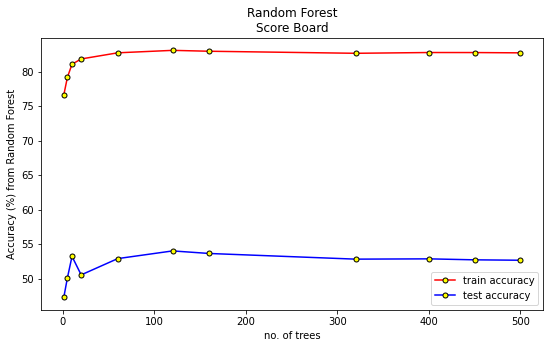

In [36]:

plt.figure(figsize=(9,5))
plt.plot(z, mape_train,  'r',  marker='o', markersize=5, markerfacecolor='yellow', markeredgewidth=1, markeredgecolor='k')
plt.plot(z, mape_test, 'b', marker='o', markersize=5, markerfacecolor='yellow', markeredgewidth=1, markeredgecolor='k')
plt.legend(['train accuracy', 'test accuracy'], loc='lower right')
plt.xlabel('no. of trees')
plt.ylabel('Accuracy (%) from Random Forest')
plt.title('Random Forest\nScore Board')
plt.show()

### XGBoost Regression

In [37]:
# hyperparameters tuning for XGBoost Regression 
xgb =xgb.XGBRegressor()
learning_rate = [0.001, 0.01, 0.1, 0.4, 0.6, 1]
n_estimators = [50, 100, 150, 300, 500, 1000]
max_depth = [i for i in range(2,11,2)]
parameters = {'nthread':[4], # hyperthread makes xgboost slower
              'objective':['reg:squarederror'],
              'learning_rate': learning_rate, ## also goes by eta
              'max_depth': max_depth,
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.75],
              'colsample_bytree': [0.75],
              'n_estimators': n_estimators}

xgb_grid = GridSearchCV(xgb,
                        parameters,
                        cv = 10,
                        n_jobs = 5,
                        verbose=False)

xgb_grid.fit(X_1_train,  y_train)
from pprint import pprint 

# summarize results
pprint(f"Best score: {xgb_grid.best_score_} using parameters: {xgb_grid.best_params_}")


("Best score: 0.2763713960154691 using parameters: {'colsample_bytree': 0.75, "
 "'learning_rate': 0.01, 'max_depth': 2, 'min_child_weight': 4, "
 "'n_estimators': 150, 'nthread': 4, 'objective': 'reg:squarederror', "
 "'silent': 1, 'subsample': 0.75}")


In [38]:
## Preparing/extracting the parameters for plots

means = xgb_grid.cv_results_['mean_test_score']
stds = xgb_grid.cv_results_['std_test_score']
params = xgb_grid.cv_results_['params']

param_=[]
n_estimator_=[]
max_depth_ = []
for param in params:
  # print(param)
  for k,val in param.items():
    if k =='learning_rate':
      param_.append(val)
    if k =='n_estimators':
      n_estimator_.append(val)
    if k =='max_depth':
      max_depth_.append(val)
    
df=pd.DataFrame()
df['loss'] = means
df['lr'] = param_
df['n_estimators'] = n_estimator_
df['max_depth'] = max_depth_


#### Hyperparameter tuning plots from XGBoost

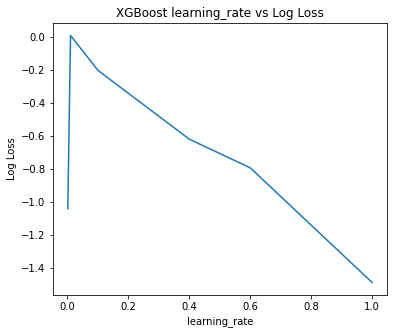

In [39]:
grouped_df = df.groupby("lr")
grouped_lists = grouped_df["loss"].apply(list)
grouped_lists = grouped_lists.reset_index()
mean_loss = []
for i in grouped_lists['loss']:
  mean_loss.append(np.mean(i))

# plot 
plt.figure(figsize=(6,5))
plt.errorbar(learning_rate, mean_loss)
plt.title("XGBoost learning_rate vs Log Loss")
plt.xlabel('learning_rate')
plt.ylabel('Log Loss')
plt.show()

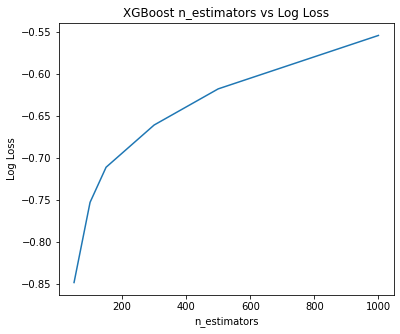

In [40]:
grouped_df = df.groupby("n_estimators")
grouped_lists = grouped_df["loss"].apply(list)
grouped_lists = grouped_lists.reset_index()
mean_loss = []
for i in grouped_lists['loss']:
  mean_loss.append(np.mean(i))

# plot
plt.figure(figsize=(6,5))
plt.errorbar(n_estimators, mean_loss)
plt.title("XGBoost n_estimators vs Log Loss")
plt.xlabel('n_estimators')
plt.ylabel('Log Loss')
plt.show()

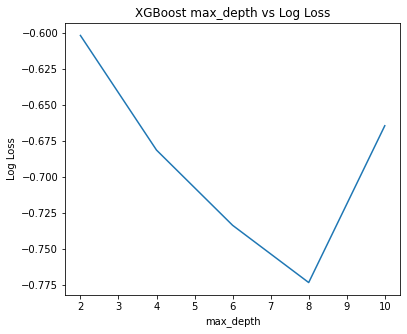

In [41]:
grouped_df = df.groupby("max_depth")
grouped_lists = grouped_df["loss"].apply(list)
grouped_lists = grouped_lists.reset_index()
mean_loss = []
for i in grouped_lists['loss']:
  mean_loss.append(np.mean(i))

# plot
plt.figure(figsize=(6,5))
plt.errorbar(max_depth, mean_loss)
plt.title("XGBoost max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

#### Final XGBoost Model with best parameters 

In [42]:
import xgboost as xgb
# create an xgboost regression model using best parameters
xg_reg  = xgb.XGBRegressor(params = xgb_grid.best_params_)
xg_reg.fit(X_1_train,y_train)
preds_tr = xg_reg.predict(X_1_train) 
preds = xg_reg.predict(X_1_test)

accuracy_xgb_tr = 100 - np.mean(100 *np.divide(abs(preds_tr - y_train), y_train))
print(f"Accuracy score from gradiant boosting on train set: {np.round(accuracy_xgb_tr,2)}%")

accuracy_xgb_tr = 100 - np.mean(100 *np.divide(abs(preds - y_test), y_test))
print(f"Accuracy score from gradiant boosting on train set: {np.round(accuracy_xgb_tr,2)}%")

[23:45:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Accuracy score from gradiant boosting on train set: 75.32%
Accuracy score from gradiant boosting on train set: 56.92%


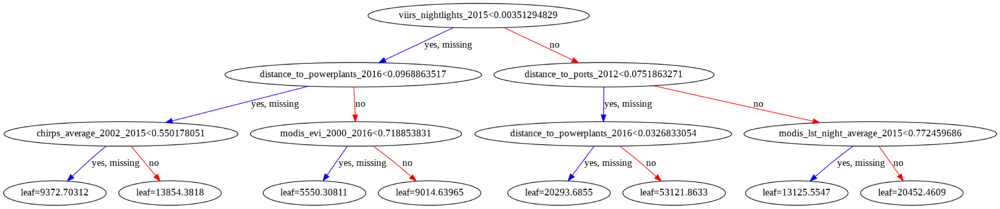

In [53]:
import matplotlib.pyplot as plt
## plot the xgboost tree
xgb.plot_tree(xg_reg,num_trees=0)
plt.rcParams['figure.figsize'] = [150, 150]
plt.show()

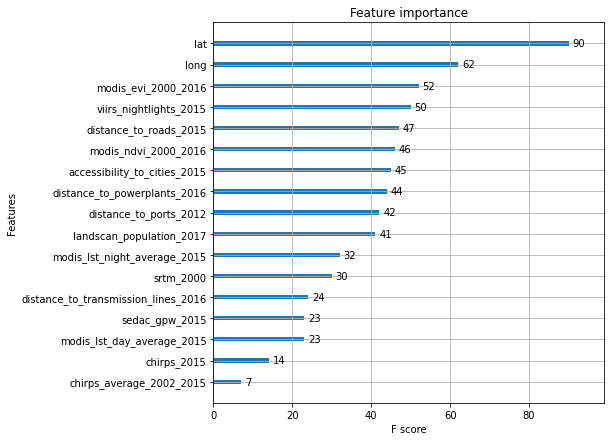

In [55]:
## Feature importance from XGBoost
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [7, 7]
plt.show()

### Decision Tree Regression

In [45]:
tree = DecisionTreeRegressor(criterion='mse', max_depth=7)         
tree.fit(X_1_train, y_train)
 
# test the output on test set, 
y_pred = tree.predict(X_1_test)
y_pred_tr = tree.predict(X_1_train)
# print the predicted price
accuracy_dc_tr = 100 - np.mean(100 *np.divide(abs(y_pred_tr - y_train), y_train))
print(f"Accuracy score from a Decision Tree on train set: {round(accuracy_dc_tr,2)}%")

accuracy_dc = 100 - np.mean(100 *np.divide(abs(y_pred - y_test), y_test))
print(f"Accuracy score from a Decision Tree on test set: {round(accuracy_dc,2)}%")


Accuracy score from a Decision Tree on train set: 75.68%
Accuracy score from a Decision Tree on test set: 46.41%


### Adaptive gradiant boosting Regression

In [46]:
from sklearn.ensemble import AdaBoostRegressor
# Fit regression model
regr_1 = DecisionTreeRegressor(max_depth=7)

regr_2 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=7),
                           n_estimators=500, random_state=SEED)
# Fit both the models
regr_1.fit(X_1_train, y_train)
regr_2.fit(X_1_test, y_test)
# Predictions
y_1_tr = regr_1.predict(X_1_train)
y_2_tr = regr_2.predict(X_1_train)

y_1 = regr_1.predict(X_1_test)
y_2 = regr_2.predict(X_1_test)

## Accuracies
print(f'Accuracy from 1 estimator on test set: {np.round(100- (np.mean(np.abs(y_train - y_1_tr) / y_train)) * 100,2)}%')
print(f'Accuracy from 500 estimators on test set: {np.round(100- (np.mean(np.abs(y_train - y_2_tr) / y_train)) * 100,2)}%')
print()
#Measuring accuracy on Testing Data
print(f'Accuracy from 1 estimator on test set: {np.round(100- (np.mean(np.abs(y_test - y_1) / y_test)) * 100,2)}%')
print(f'Accuracy from 500 estimators on test set: {np.round(100- (np.mean(np.abs(y_test - y_2) / y_test)) * 100,2)}%')

Accuracy from 1 estimator on test set: 75.68%
Accuracy from 500 estimators on test set: 53.36%

Accuracy from 1 estimator on test set: 43.44%
Accuracy from 500 estimators on test set: 79.48%


### Support Vector Machines Regression

#### Linear kernel

In [47]:
from sklearn.svm import SVR
regressor = SVR(kernel='linear')
regressor.fit(X_1_train,y_train)
y_pred_train = regressor.predict(X_1_train)
y_pred_test = regressor.predict(X_1_test)
print(f'Accuracy from SVM on train data from linear kernel: {np.round(100- (np.mean(np.abs(y_train - y_pred_train) / y_train)) * 100,2)}%')
print(f'Accuracy from SVM on tests data from linear kernel: {np.round(100- (np.mean(np.abs(y_test - y_pred_test) / y_test)) * 100,2)}%')


Accuracy from SVM on train data from linear kernel: 34.95%
Accuracy from SVM on tests data from linear kernel: 34.66%


#### Polynomial kernel

In [48]:
from sklearn.svm import SVR
regressor = SVR(kernel='poly', degree=14)
regressor.fit(X_1_train,y_train)
y_pred_train = regressor.predict(X_1_train)
y_pred_test = regressor.predict(X_1_test)
print(f'Accuracy from SVM on train data from polynomial kernel: {np.round(100- (np.mean(np.abs(y_train - y_pred_train) / y_train)) * 100,2)}%')
print(f'Accuracy from SVM on tests data from polynomial kernel: {np.round(100- (np.mean(np.abs(y_test - y_pred_test) / y_test)) * 100,2)}%')


Accuracy from SVM on train data from polynomial kernel: 63.48%
Accuracy from SVM on tests data from polynomial kernel: 50.49%


#### Radial-bias kernel

In [49]:
from sklearn.svm import SVR
regressor = SVR(kernel='rbf')
regressor.fit(X_1_train,y_train)
y_pred_train = regressor.predict(X_1_train)
y_pred_test = regressor.predict(X_1_test)
print(f'Accuracy from SVM on train data from rbf kernel: {np.round(100- (np.mean(np.abs(y_train - y_pred_train) / y_train)) * 100,2)}%')
print(f'Accuracy from SVM on tests data from rbf kernel: {np.round(100- (np.mean(np.abs(y_test - y_pred_test) / y_test)) * 100,2)}%')


Accuracy from SVM on train data from rbf kernel: 34.91%
Accuracy from SVM on tests data from rbf kernel: 34.62%


### K-Nearest Neighbor

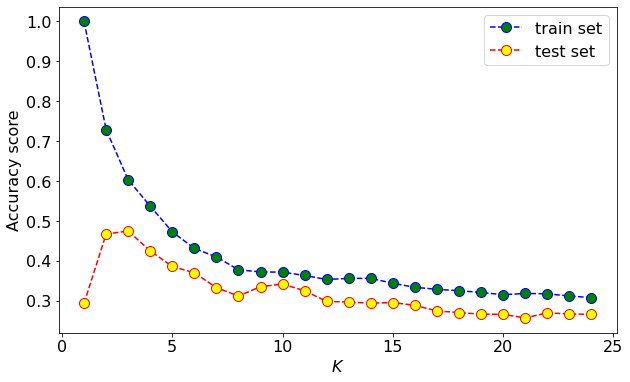

In [50]:
# %% # Implement knn classifier #####

# %% # Calculating error for K values between 1 and 25.
from sklearn.neighbors import KNeighborsRegressor
error , error_tr = [], []


for i in range(1, 25):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(X_1_train, y_train)
    pred_i = knn.predict(X_1_test)
    pred_i_tr = knn.predict(X_1_train)
    train_scores.append(knn.score(X_1_train, y_train))
    test_scores.append(knn.score(X_1_test, y_test))
# print(test_scores)

### plotting KNN accuraces for train and test ####
plt.figure(figsize=(10, 6))

plt.plot(range(1, 25), train_scores,  color='blue', linestyle='dashed', marker='o',markerfacecolor='green', markersize=10)
plt.plot(range(1, 25), test_scores,  color='red', linestyle='dashed', marker='o', markerfacecolor='yellow', markersize=10)
#plt.title('Error Rate in K Value', fontsize=16)
plt.xlabel(r'$K$', fontsize=16)
plt.ylabel('Accuracy score', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(['train set', 'test set'], loc='best', fontsize=16)


#### Final KNN model for best k=3

In [51]:
#Create KNN Classifier for best k==3
knn = KNeighborsRegressor(n_neighbors=3)

#Train the model using the training sets
knn.fit(X_1_train, y_train)
#Predict the response for rain dataset
yknn_pred_train = knn.predict(X_1_train)
#Predict the response for test dataset
yknn_pred_test = knn.predict(X_1_test)

# print accuracy
print("KNN Accuracy (best k=3) on train set: {:.2f}%".format(100*knn.score(X_1_train, y_train)))
print("KNN Accuracy (best k=3) on test set: {:.2f}%".format(100*knn.score(X_1_test, y_test)))


KNN Accuracy (best k=3) on train set: 60.34%
KNN Accuracy (best k=3) on test set: 47.50%


# Interpretation of the Models


The current dataset contains more than 500 locations in  Nigeria to predict the median expenditure of several Nigerian neighborhoods. To explore the rastar data, locations have been plotted in folium and plotly library to have an overview on how the expenditure is correlated with other predictor variables. Data exploration has been carried out from several relationship plots in seaborn library to establish a few general trends in data observations. Standard procedures in feature engineering (lasso regression, random forest regressor) and outlier removal (Quantile rule: mean +/- 3std) have been carried out as the final step of data preprocessing. Min-max normalization has been applied only on the predictor variables. Since the response variable is very skewed, it has been barred from any data normalization. The dataset has been split into 75:25 for train and test sets. The overall prediction scores are moderately suitable for both the sets from polynomial regression,  Support vector machine (polynomial kernel), Decision tree, and k-nearest neighbor (k=3) algorithms. Otherwise, the tree-based models like RandomForest, XGBoost, and Adaboost algorithm predictions on train and test sets are better. It has been established that if proper hyperparameter tuning could be carried out on a tree-based model like XGBoost, the prediction could give an accuracy score on a test set of as high as 57%, which is 9.4% higher than the accuracy metric from the best KNN model.  

Based on the current analysis to predict median expenditure, tree-based models outperformed regression analysis to minimize the test set's generalization error. **If I had to choose one model for prediction, I would go for XGBoost with the best hyper-parameters because once the model is hyper tuned, its the most favorable for forecasts. We might need to compromise on execution time, though.**



